# Graded Exercise 2#

<font color="red">due May 16</font>

In [1]:
# If you have any suggestions about the exercises or the tutorial,
# you can provide them here!

<hr />

# Part I - Geopandas

## Taxable income of Swiss communities

You want to visualize the mean taxable income of Swiss communities by plotting colors onto a map of Switzerland.

### Exercise 1.1

Get data from swisstopo that holds information on administrative boundaries of Swiss communities:

https://www.swisstopo.admin.ch/en/geodata/landscape/boundaries3d.html

I recommend to use the following file:
* **swissboundaries3d_2020-10_2056_5728.shp.zip** (<a href='https://data.geo.admin.ch/ch.swisstopo.swissboundaries3d/swissboundaries3d_2020-10/swissboundaries3d_2020-10_2056_5728.shp.zip'>Link</a>)

You find it when you scroll down a lot.

Then, read the file **swissBOUNDARIES3D_1_5_TLM_HOHEITSGEBIET.shp** using GeoPandas and **plot a map of the Swiss communities to check if everything worked**.

Be sure, that you use the correct files in these steps!<br />
Also I recommend to develop your code in a jupyter notebook since Colab usually is more troublesome regarding the management of the multiple geo-data files needed and also tends to crash when reading larges Shapefiles.

In [2]:
import os
import geopandas as gdp
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import time
from tqdm import tqdm # progress bar for for loops
import json
import re

In [3]:
os.chdir("../4_Data")

In [4]:
boundaries = gdp.read_file("swissboundaries-graded-ex\swissBOUNDARIES3D_1_5_TLM_HOHEITSGEBIET.shp")

In [5]:
from itables import show
show(boundaries)

<Axes: >

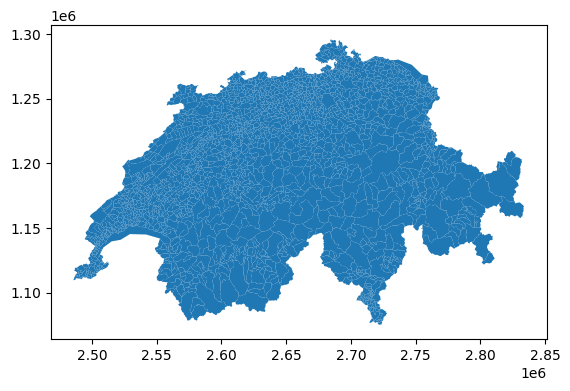

In [6]:
boundaries.plot()

### Execise 1.2

Download data on the average taxable incomes of Swiss communities. You can find it on the website of the Swiss Federal Tax Administration (FTA): https://www.estv.admin.ch/estv/de/home/die-estv/steuerstatistiken-estv/allgemeine-steuerstatistiken/direkte-bundessteuer.html#835146521

We recommend you use the 2020 statistics, which you can download directly with this link: https://www.estv.admin.ch/dam/estv/de/dokumente/estv/steuerstatistiken/direkte-bundessteuer/statistik-dbst-np-kennzahlen-ohne-2020-de.xlsx.download.xlsx/statistik-dbst-np-kennzahlen-ohne-2020-de.xlsx

Read in the data of the sheet **"Gemeinden - Communes"**.

In [7]:
fta = pd.read_excel("statistik-dbst-np-kennzahlen-ohne-2020-de.xlsx", "Gemeinden - Communes")

fta.head()


,ktnr,ktname,gdenr,gdename,Einheit ID,Einheit,stpf,snpstbetr,mean_stbetr,median_stbetr,...,gini_steink,mean_steinka,median_steinka,gini_steinka,mean_reink,median_reink,gini_reink,mean_reinka,median_reinka,gini_reinka
0,1,Zürich,1,Aeugst am Albis,T,Total,1223,5570688.0,4554.937040,725.0,...,0.535425,66481.801856,52200.0,0.488480,100961.242845,69900.0,0.521903,71714.552856,58200.000000,0.465554
1,1,Zürich,2,Affoltern am Albis,T,Total,7168,11660885.0,1626.797573,338.0,...,0.434718,47543.351388,41900.0,0.404963,69210.253906,56700.0,0.422399,52495.019745,47133.333333,0.375972
2,1,Zürich,3,Bonstetten,T,Total,3124,7724717.0,2472.700704,659.0,...,0.427715,55516.177602,50500.0,0.389768,86071.959027,72550.0,0.420973,61229.759087,56392.307692,0.366306
3,1,Zürich,4,Hausen am Albis,T,Total,2180,6845483.0,3140.129817,474.0,...,0.502102,56745.777376,46300.0,0.452896,87703.899083,63850.0,0.487344,62197.775923,51972.222222,0.426227
4,1,Zürich,5,Hedingen,T,Total,2181,6616653.5,3033.770518,592.0,...,0.467062,58244.339569,48600.0,0.424938,88262.127464,68000.0,0.457642,63621.419738,54900.000000,0.401130


### Exercise 1.3

Merge the FTA data to the data that holds the geo-information. Hint: the column to merge on varies between the two datasets (``BFS_NUMMER``, ``gdenr``).

In [8]:
boundaries_fta = pd.merge(boundaries, fta, left_on="BFS_NUMMER", right_on="gdenr", how="left")

boundaries_fta.columns

Index(['UUID', 'DATUM_AEND', 'DATUM_ERST', 'ERSTELL_J', 'ERSTELL_M',
       'GRUND_AEND', 'HERKUNFT', 'HERKUNFT_J', 'HERKUNFT_M', 'REVISION_J',
       'REVISION_M', 'REVISION_Q', 'OBJEKTART', 'BFS_NUMMER', 'BEZIRKSNUM',
       'KANTONSNUM', 'NAME', 'GEM_FLAECH', 'SEE_FLAECH', 'ICC', 'SHN',
       'EINWOHNERZ', 'HIST_NR', 'geometry', 'ktnr', 'ktname', 'gdenr',
       'gdename', 'Einheit ID', 'Einheit', 'stpf', 'snpstbetr', 'mean_stbetr',
       'median_stbetr', 'gini_stbetr', 'mean_steink', 'median_steink',
       'gini_steink', 'mean_steinka', 'median_steinka', 'gini_steinka',
       'mean_reink', 'median_reink', 'gini_reink', 'mean_reinka',
       'median_reinka', 'gini_reinka'],
      dtype='object')

### Exercise 1.4

Plot a map of Switzerland that colors each community according to its income level. Your column of interest is ``mean_steink``, which holds information on the taxable income.

Try to customize/improve your plot to make it informative and appealing.

In [9]:
compact = boundaries_fta[["mean_steink", "geometry"]] # drop other columns we don't need

In [ ]:
quantiles = {q: compact["mean_steink"].quantile(q) for q in [0.1, 0.2, 0.5, 0.8, 0.9, 0.99]} 
# i have deliberately chosen these quantiles. they seem to get a decent result on the plot (meaning we can see many differences even in the communities with higher mean_steink)

def income_group(x, quantiles):
    for q, cutoff in sorted(quantiles.items()):
        if x <= cutoff:
            return f"{100*q}% - {round(cutoff / 1000)}K CHF"
    # if above the highest cutoff:
    if np.isnan(x):
        return np.nan
    return f" > {100 * max(quantiles.keys())}% - {round(max(quantiles.values()) / 1000)}K CHF"

compact["income_level"] = compact["mean_steink"].apply(income_group, args = [quantiles])

# add the labels into a list so that we can apply a categorical value onto income_level (correct ordering)
labels = [
    f"{100 * q}% - {round(cutoff / 1000)}K CHF"
    for q, cutoff in sorted(quantiles.items())
]
max_q, max_cutoff = max(quantiles.items())
labels.append(f" > {100 * max_q}% - {round(max_cutoff / 1000)}K CHF")

compact["income_level"] = pd.Categorical(
    compact["income_level"],
    categories=labels,
    ordered=True
)

compact


C:\Users\Raphael\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,mean_steink,geometry,income_level
0,51549.635762,"POLYGON Z ((2803369.136 1191207.211 3111.083, ...",50.0% - 57K CHF
1,48414.780716,"POLYGON Z ((2712665.708 1185502.929 3605.123, ...",50.0% - 57K CHF
2,54805.730994,"POLYGON Z ((2803369.136 1191207.211 3111.083, ...",50.0% - 57K CHF
3,39498.684211,"POLYGON Z ((2757700.559 1163421.151 2972.528, ...",10.0% - 44K CHF
4,NaN,MULTIPOLYGON Z (((2508390.583 1137980.442 372....,NaN
...,...,...,...
2223,93589.598352,"POLYGON Z ((2541459.88 1150595.604 372.13, 254...",99.0% - 144K CHF
2224,74689.805825,"POLYGON Z ((2726022.11 1280781.883 395.459, 27...",90.0% - 78K CHF
2225,55989.156627,"POLYGON Z ((2673562.683 1269339.664 334.574, 2...",50.0% - 57K CHF
2226,66072.294372,"POLYGON Z ((2549875.115 1147189.22 372.143, 25...",80.0% - 67K CHF


In [11]:
waters = boundaries.loc[(boundaries["EINWOHNERZ"] == 0), ["NAME", "geometry"]] # color the water accordingly
waters

,NAME,geometry
4,Lac Léman (VD),MULTIPOLYGON Z (((2508390.583 1137980.442 372....
55,Bodensee (TG),MULTIPOLYGON Z (((2732787.076 1278568.966 395....
92,Lac de Neuchâtel (NE),"POLYGON Z ((2556786.369 1199525.236 429.266, 2..."
147,Zürichsee (ZH),"POLYGON Z ((2683453.841 1243308.674 406.608, 2..."
185,Thunersee,"POLYGON Z ((2623505.019 1167656.597 557.7, 262..."
191,Bodensee (SG),"POLYGON Z ((2760034.649 1262664.63 395.108, 27..."
222,Lac de Neuchâtel (VD),MULTIPOLYGON Z (((2545148.573 1184120.963 429....
231,Bielersee (BE),"POLYGON Z ((2577288.151 1210309.127 429.19, 25..."
306,Brienzersee,"POLYGON Z ((2638360.914 1172017.011 564.018, 2..."
1063,Lac de Joux,"POLYGON Z ((2514767.878 1169084.505 1004.264, ..."


In [12]:
cities = boundaries.loc[(boundaries["EINWOHNERZ"] > 50000), ["NAME", "geometry"]] # show the names of the biggest cities on the plot

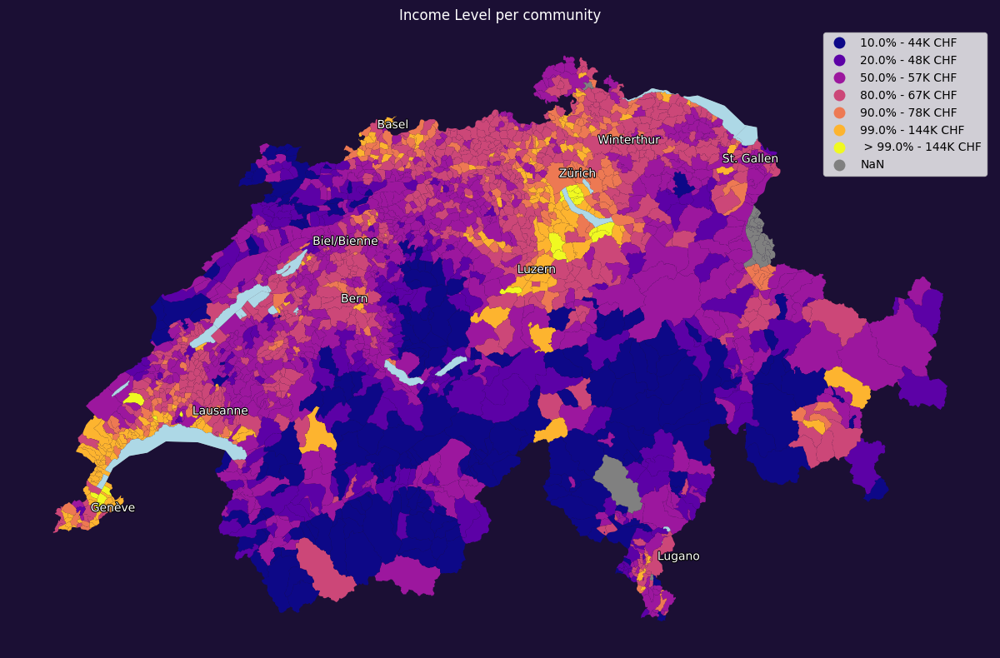

In [13]:
import matplotlib.patheffects as patheffects

fig, ax = plt.subplots(figsize = (16, 8))

compact.plot(ax=ax,
             column="income_level",
             legend=True,
             cmap="plasma",
             missing_kwds={"color": "grey"})

waters.plot(ax=ax,
            color = "lightblue")

for i in range(len(cities)):
    ax.text(x=cities.centroid.iloc[i].x,
            y=cities.centroid.iloc[i].y,
            s=cities.iloc[i]["NAME"],
            color="white",
            path_effects=[patheffects.withStroke(linewidth=1.5, foreground="black")])

ax.axis("off")

ax.set_title("Income Level per community", color = "white")
fig.set_facecolor("#1b0f34")

fig.tight_layout()

plt.show()

<hr />

# Part II - APIs / Beautifulsoup

For this exercise, you will work with the New York Times Article API. <b>Read the instructions carefully and, for each exercise, make sure that you plot and print() the required outputs and that these are included in the notebook that you hand in.</b>

## Register for the NYT API

**First of all, you need to obtain an API key:**

  * Head over to https://developer.nytimes.com/accounts/create
  * Type in your credentials, then confirm your email, head back to your browser and use these credentials to log in here https://developer.nytimes.com/?it=a
  * Now click on your username (top right)
  * Click on `Apps` and then on `+ NEW APP`
  * Give your app some name and a description
  * Activate all the sub-apis you'd like to use. For now, you can select all, but definitely select the `Article Search API` and click `create`.
  * You should now receive an API `NYT_KEY`



### Exercise 2.1

**Setup of the API Key**

Your API Key is confidential, so keep it safe. It is good practice not to copy it into a notebook. Store your credentials in a separate file instead. **When you use the API-Key, your notebook should read the key from this file**. This way you can send your notebook to people without exposing you to the risk of others abusing your key. Do not show me your API key!

In [14]:
env = {}
with open(".env", "r") as env_file:
    for line in env_file:
        if "=" in line and not line.startswith("#"):  # Ignore comments and invalid lines
            key, value = line.strip().split("=", 1)
            env[key] = value

print(env.keys())

dict_keys(['NYT_KEY', 'NYT_SECRET'])


### Exercise 2.2

Read into the documentation of the API. Find out how to request articles, i.e. which **endpoint** and **parameters** you need to use, whether there are **rate limits**, etc.

Some good starting points are:
- https://developer.nytimes.com/get-started
- https://developer.nytimes.com/apis
- https://developer.nytimes.com/docs/articlesearch-product/1/routes/articlesearch.json/get
- https://developer.nytimes.com/faq


In [16]:
import requests

base_url = f"https://api.nytimes.com/svc/search/v2/articlesearch.json?api-key={env['NYT_KEY']}"

### Exercise 2.3

Do a test-call to the API that searches for articles about "ChatGPT" between January 1st 2023 and May 15 2023.
**Print the output of** ``print(len(data["response"]["docs"]))`` (or whatever name your object has) so I can see that everything works fine.

In [17]:
params = {
    "begin_date": "20230101",
    "end_date": "20230515",
    "q": "ChatGPT"
}

r = requests.get(base_url, params=params)

len(r.json()["response"]["docs"])

10

### Exercise 2.4

Print the abstract and URL of the second article (index [1]):

In [19]:
data = r.json()

In [20]:
data["response"]["docs"][1]["abstract"]

'The company unveiled new technology called GPT-4 four months after its ChatGPT stunned Silicon Valley. The update is an improvement, but it carries some of the same baggage.'

In [21]:
data["response"]["docs"][1]["web_url"]

'https://www.nytimes.com/2023/03/14/technology/openai-gpt4-chatgpt.html'

### Exercise 2.5

You will notice that you only got 10 articles. Why aren't there more? Find out how many articles you should have found according to your API response. Then, re-visit the documentation and find a way to collect all articles containing your search term (should be around 300). Create a ``pandas`` ``DataFrame`` that has the following columns:
 - Abstract
 - Web URL
 - Publication date
 - Type of the document


 ... for all articles.

**Please print the dimensions (``df.shape``) of your pandas df to prove that you achieved the task.**

 **If you could not achieve to create the full set of data, you can load it from here: http://farys.org/daten/nyt_chatgpt.csv**


In [22]:
total_hits = data["response"]["metadata"]["hits"]
total_hits
n_pages = math.ceil(total_hits / 10)

In [23]:
responses = {}

if False: # do not run this block except if you really need to
    for i in tqdm(range(n_pages)):
        params = {
            "begin_date": "20230101",
            "end_date": "20230515",
            "q": "ChatGPT",
            "page": f"{i}"
        }
        r = requests.get(base_url, params=params)
        responses[i] = r.json()
        time.sleep(12) # 5 call per minute limit

In [24]:
if len(responses) > 0: # only write the data if we actually collected any, otherwise all data is lost :(
    with open('nyt-data.json', 'w') as f:
        json.dump(responses, f, indent=4) # responses saved in a json file, since i do not want to wait every time 7 minutes

In [25]:
with open("nyt-data.json", "r") as f:
    nyt_data = json.load(f)

nyt_data # work with local copy from now on

{'0': {'status': 'OK',
  'copyright': 'Copyright (c) 2025 The New York Times Company. All Rights Reserved.',
  'response': {'docs': [{'abstract': 'Artificial intelligence is confronting white-collar professionals more directly than ever. It could make them more productive — or obsolete.',
     'byline': {'original': 'By Lydia DePillis and Steve Lohr'},
     'document_type': 'article',
     'headline': {'main': 'Tinkering With ChatGPT, Workers Wonder: Will This Take My Job?',
      'kicker': '',
      'print_headline': 'For Workers, Promise of A.I. Is a Threat, Too '},
     '_id': 'nyt://article/86405b9e-ece7-5fb5-9fd9-8ff1090f4d29',
     'keywords': [{'name': 'Subject',
       'value': 'Artificial Intelligence',
       'rank': 1},
      {'name': 'Subject', 'value': 'ChatGPT', 'rank': 2},
      {'name': 'Subject', 'value': 'Labor and Jobs', 'rank': 3},
      {'name': 'Subject', 'value': 'Careers and Professions', 'rank': 4},
      {'name': 'Subject', 'value': 'Computers and the Internet

In [26]:
nyt_df = pd.DataFrame(columns=["abstract", "url", "pubdate", "doctype"])

for batch in nyt_data.values():
    for article in batch["response"]["docs"]:
        abstract = article["abstract"]
        url = article["web_url"]
        pubdate = article["pub_date"]
        doctype = article["document_type"]
        # Create a new DataFrame for the current article
        article_df = pd.DataFrame([{"abstract": abstract, "url": url, "pubdate": pubdate, "doctype": doctype}])
        # Append the new DataFrame to the existing DataFrame
        nyt_df = pd.concat([nyt_df, article_df], ignore_index=True)

nyt_df.shape


(315, 4)

### Exercise 2.6

Create new columns in your df:
  * 1. The hour of the day when the article was released and
  * 2. The month.

From this information, create two informative and appealing bar plots (or something similar) to visualize
  * 1. The publication frequency during an average day and
  * 2. The number of articles per month.

In [ ]:
# pubdate column looks like 2023-03-28T09:00:25Z
# we can extract the hour of the day and the month with regex patterns

nyt_df["pubmonth"] = nyt_df["pubdate"].str.extract(r"^\d{4}-(\d{2})-\d{2}T.{9}$").astype(int)
nyt_df["pubhour"] = nyt_df["pubdate"].str.extract(r"^.{10}T(\d{2}):\d{2}:\d{2}Z$").astype(int)

nyt_df

,abstract,url,pubdate,doctype,pubmonth,pubhour
0,Artificial intelligence is confronting white-c...,https://www.nytimes.com/2023/03/28/business/ec...,2023-03-28T09:00:25Z,article,3,9
1,The company unveiled new technology called GPT...,https://www.nytimes.com/2023/03/14/technology/...,2023-03-14T17:04:15Z,article,3,17
2,Journalists may have a new semi-reliable source.,https://www.nytimes.com/2023/04/21/opinion/cha...,2023-04-21T09:00:19Z,article,4,9
3,With the rise of the popular new chatbot ChatG...,https://www.nytimes.com/2023/01/16/technology/...,2023-01-16T10:00:26Z,article,1,10
4,The action by Italy’s data protection agency i...,https://www.nytimes.com/2023/03/31/technology/...,2023-03-31T16:02:02Z,article,3,16
...,...,...,...,...,...,...
310,"The Mar. 21, 2023, episode of “The Ezra Klein ...",https://www.nytimes.com/2023/03/21/podcasts/ez...,2023-03-21T15:15:28Z,article,3,15
311,"The April 11, 2023, episode of “The Ezra Klein...",https://www.nytimes.com/2023/04/11/podcasts/ez...,2023-04-11T16:16:26Z,article,4,16
312,"The April 7, 2023, episode of “The Ezra Klein ...",https://www.nytimes.com/2023/04/07/podcasts/ez...,2023-04-07T15:18:45Z,article,4,15
313,"The April 14, 2023, episode of “The Ezra Klein...",https://www.nytimes.com/2023/04/14/podcasts/ez...,2023-04-14T16:42:29Z,article,4,16


In [28]:
hourly_freq = nyt_df.groupby("pubhour")["url"].count().reset_index()
hourly_freq

,pubhour,url
0,0,1
1,2,4
2,4,8
3,5,9
4,6,3
5,7,5
6,8,7
7,9,44
8,10,40
9,11,25


In [29]:
article_per_month = nyt_df.groupby("pubmonth")["url"].count().reset_index()
article_per_month

,pubmonth,url
0,1,53
1,2,69
2,3,94
3,4,58
4,5,41


C:\Users\Raphael\AppData\Local\Temp\ipykernel_14180\364436741.py:32: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


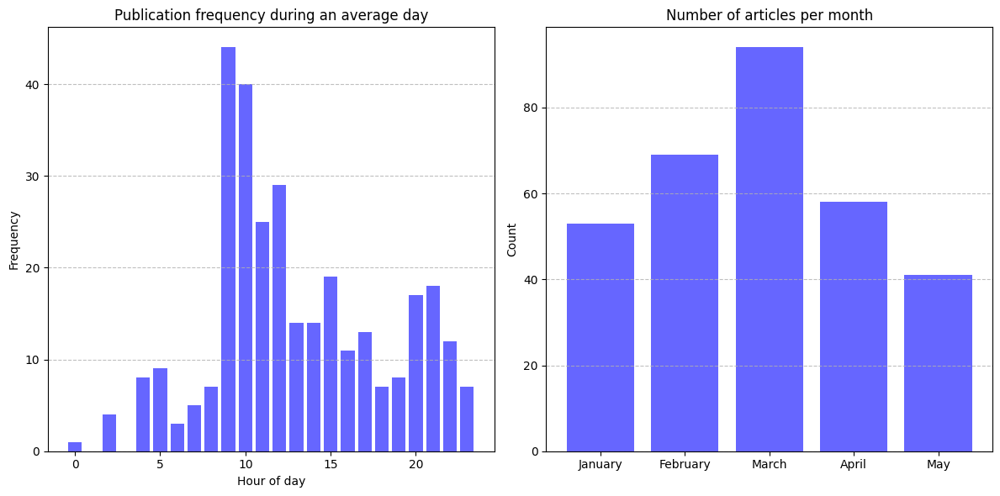

In [ ]:
months = {
    1: "January",
    2: "February",
    3: "March",
    4: "April",
    5: "May"
}
# recode the numbers 1 to 5 to the actual month name for the x axis labels
article_per_month["month"] = article_per_month["pubmonth"].map(months)

fig, ax = plt.subplots(ncols=2, figsize=(12, 6))

ax[0].bar(hourly_freq["pubhour"],
          hourly_freq["url"],
          color="#6666ff")
ax[0].grid(alpha=0.8,
           axis="y",
           linestyle="--")
ax[0].set_title("Publication frequency during an average day")
ax[0].set_xlabel("Hour of day")
ax[0].set_ylabel("Frequency")

ax[1].bar(article_per_month["month"],
          article_per_month["url"],
          color="#6666ff")
ax[1].grid(alpha=0.8,
           axis="y",
           linestyle="--")
ax[1].set_title("Number of articles per month")
ax[1].set_ylabel("Count")

fig.tight_layout()
fig.show()